In [24]:
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2
import pandas
from scipy import ndimage
from PIL import Image 
import PIL 
from math import log10, sqrt
from sklearn.cluster import MiniBatchKMeans

In [39]:
def imshow(*args, title=None, figsize=20, to_rgb=True, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    if to_rgb:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    if title is not None:
        assert len(title) == len(images), "Please provide a title for each image."
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(len(images), 1, i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        if images[i-1].ndim == 2:
            plt.imshow(images[i-1], cmap='gray')
        else:
            plt.imshow(images[i-1])
        plt.axis('off')

# 6.1. Color space

## 6.1.1. Convert Lena to HSI format, and display the HIS components as separate grayscale images

In [12]:
lena = cv2.imread('/content/sample_data/Lena.bmp')

In [13]:
def RGB_to_HSI(img):
  r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]
  r = r / 255.0
  g = g / 255.0
  b = b / 255.0
  i = (r + g + b) / 3
  theta = np.arccos(0.5 * ((r - g) + (r - b)) / np.sqrt((r - g)**2 +
  (r - b) * (g - b)))
  h = np.where(b <= g, theta, 2 * np.pi - theta)
  s = 1 - 3 * np.minimum(np.minimum(r, g), b) / (r + g + b)

  return [h, s, i]

In [14]:
h, s, i = RGB_to_HSI(lena)

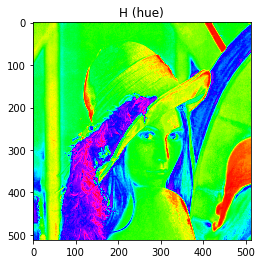

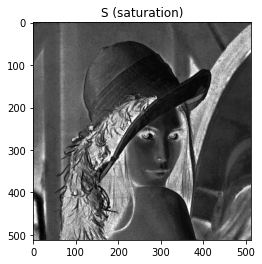

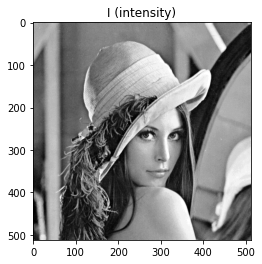

In [17]:
plt.imshow(h,'hsv'),plt.title("H (hue)")
plt.show()
plt.imshow(s,'gray'),plt.title("S (saturation)")
plt.show()
plt.imshow(i,'gray'),plt.title("I (intensity)")
plt.show()

In [18]:
cv2.imwrite('h.png', h * 255)
cv2.imwrite('s.png', s * 255)
cv2.imwrite('i.png', i * 255)

True

## 6.1.2. *Present and discuss new color space (at least three) in detail which was not introduced in class

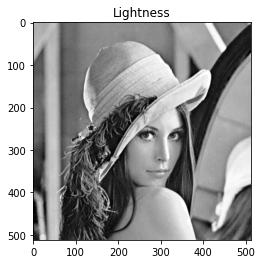

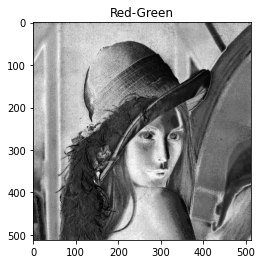

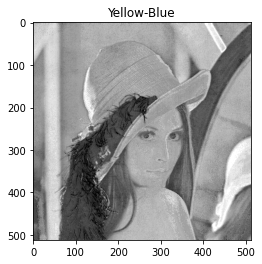

In [22]:
img_luv = cv2.cvtColor(lena, cv2.COLOR_BGR2LUV)
l, u, v = cv2.split(img_luv)
plt.imshow(l,'gray'),plt.title("Lightness")
plt.show()
plt.imshow(u,'gray'),plt.title("Red-Green")
plt.show()
plt.imshow(v,'gray'),plt.title("Yellow-Blue")
plt.show()

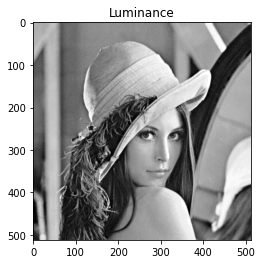

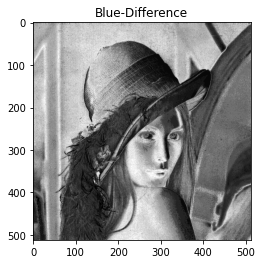

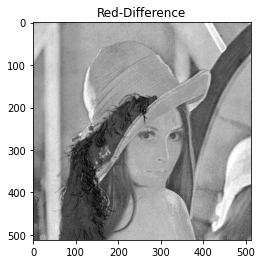

In [23]:
img_yuv = cv2.cvtColor(lena, cv2.COLOR_BGR2YUV)
y, u, v = cv2.split(img_luv)
plt.imshow(y,'gray'),plt.title("Luminance")
plt.show()
plt.imshow(u,'gray'),plt.title("Blue-Difference")
plt.show()
plt.imshow(v,'gray'),plt.title("Red-Difference")
plt.show()

# 6.2. Quantization

In [25]:
def quantize_global(x, k):
  k_means = MiniBatchKMeans(k, compute_labels=False)
  k_means.fit(x.reshape(-1, 1))
  labels = k_means.predict(x.reshape(-1, 1))
  q_x = k_means.cluster_centers_[labels]
  q_img = np.uint8(q_x.reshape(x.shape))
  return q_img

In [26]:
def quantize_channels(x, k):
  quantized_x = x.copy()
  for d in range(len(k)):
    channel = x[:, :, d].copy()
    k_means = MiniBatchKMeans(k[d], compute_labels=False)
    k_means.fit(channel.reshape(-1, 1))
    labels = k_means.predict(channel.reshape(-1, 1))
    quantized_x[:, :, d] = np.uint8(k_means.cluster_centers_[labels]).reshape(channel.shape)
  return quantized_x

In [28]:
def get_region_index(color_value):
    eight_regions = [[0,31], [32,63], [64,95], [96,127], [128,159], [160,191], [192,223], [224,255]]
    for index, region_value in enumerate(eight_regions):
        if color_value >= region_value[0] and  color_value <= region_value[1]:
            return index

In [29]:
def mse(imageA, imageB):
	return np.square(imageA.astype('int16') - 
	                 imageB.astype('int16')).mean()

In [30]:
def PSNR(original, compressed):
  MSE = mse(original, compressed)
  if MSE == 0:
      return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(MSE))
  return psnr

In [35]:
lena = cv2.imread('/content/sample_data/Lena.bmp', cv2.IMREAD_UNCHANGED)

##6.2.1. Implement uniform quantization of a color image.

In [36]:
q64 = quantize_global(lena, 64)
q32 = quantize_global(lena, 32)
q16 = quantize_global(lena, 16)
q8 = quantize_global(lena, 8)

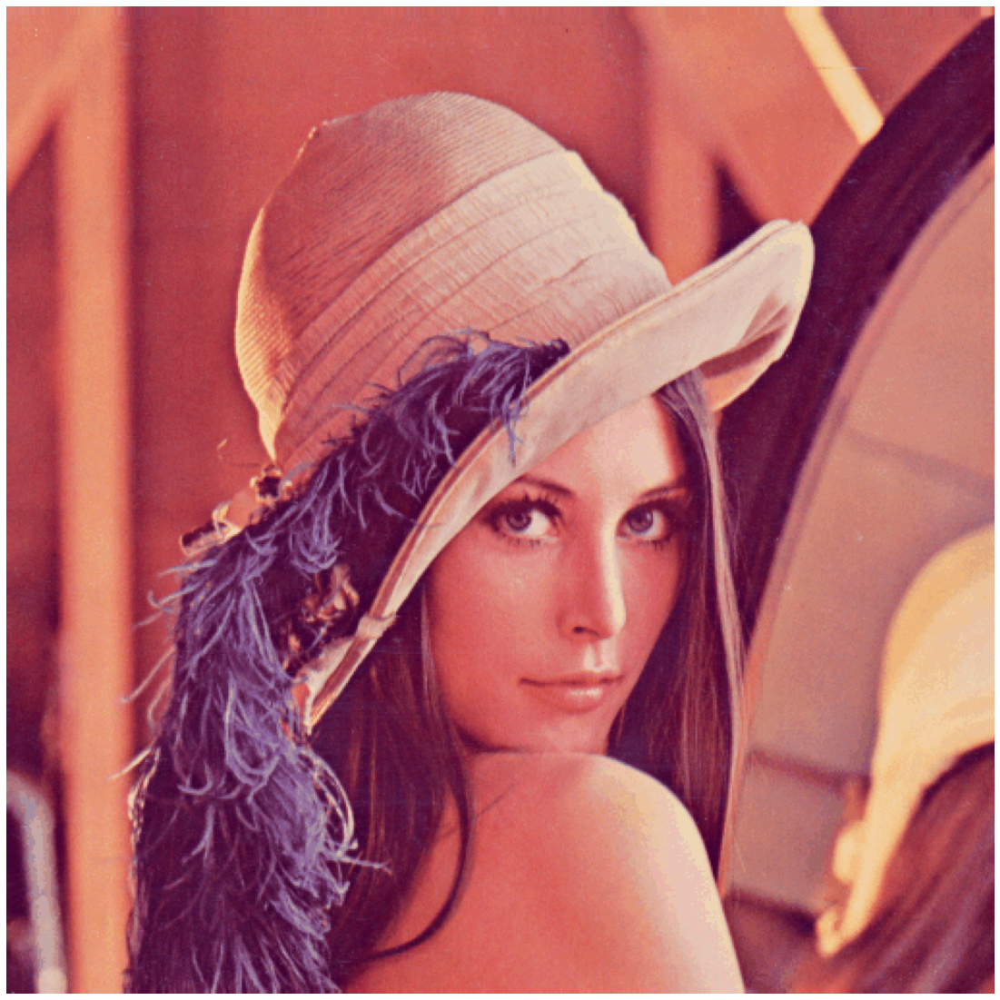

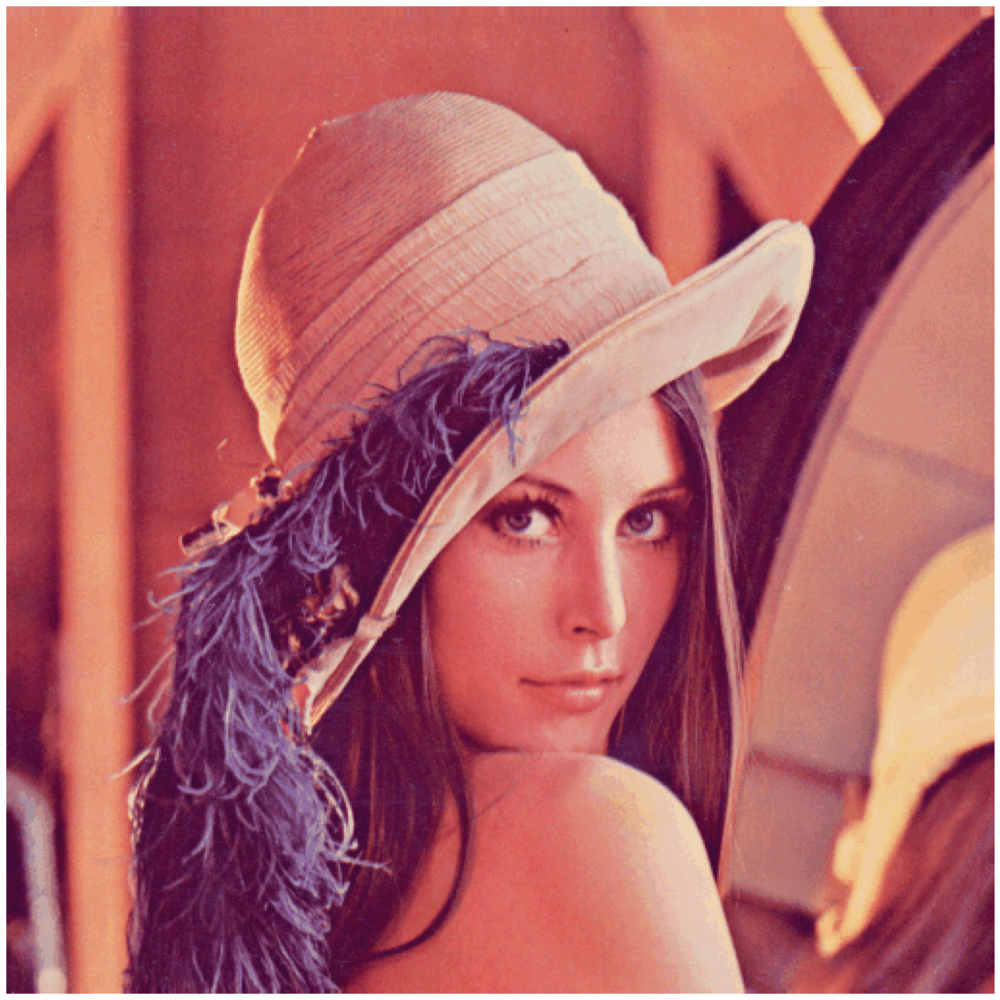

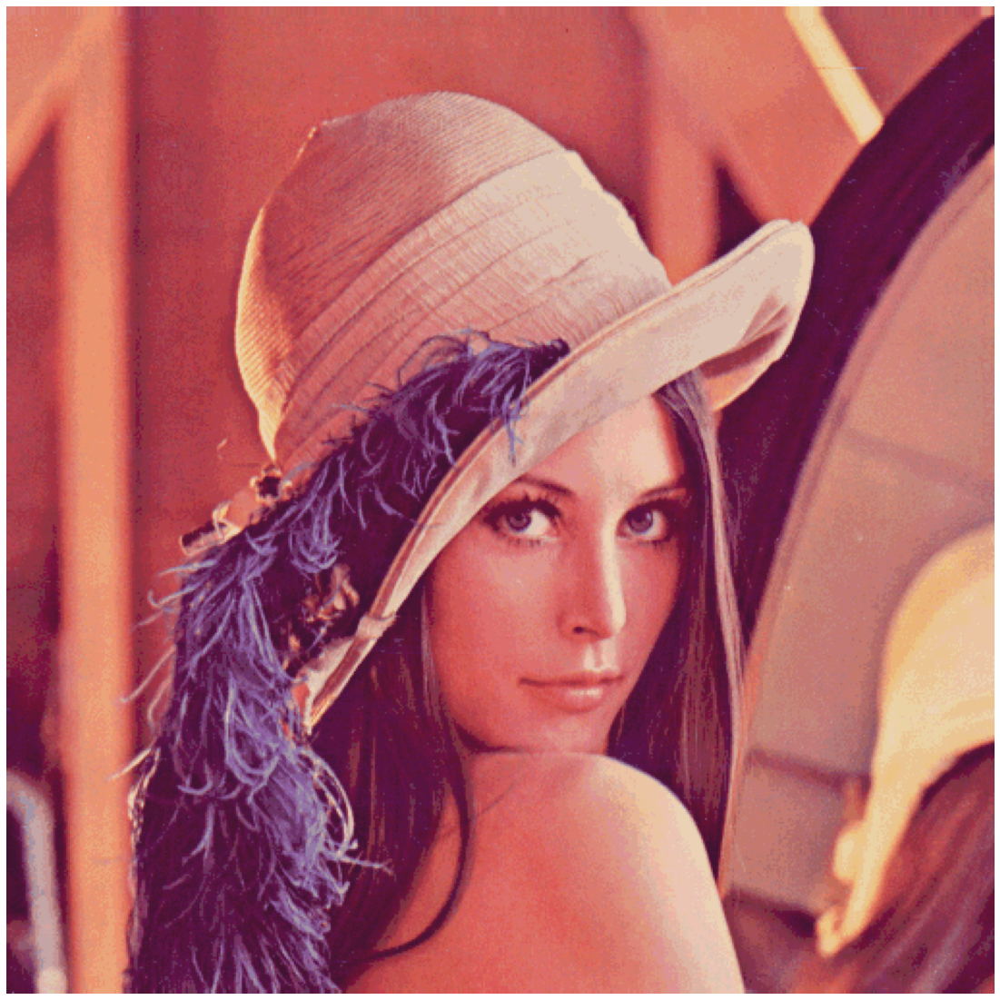

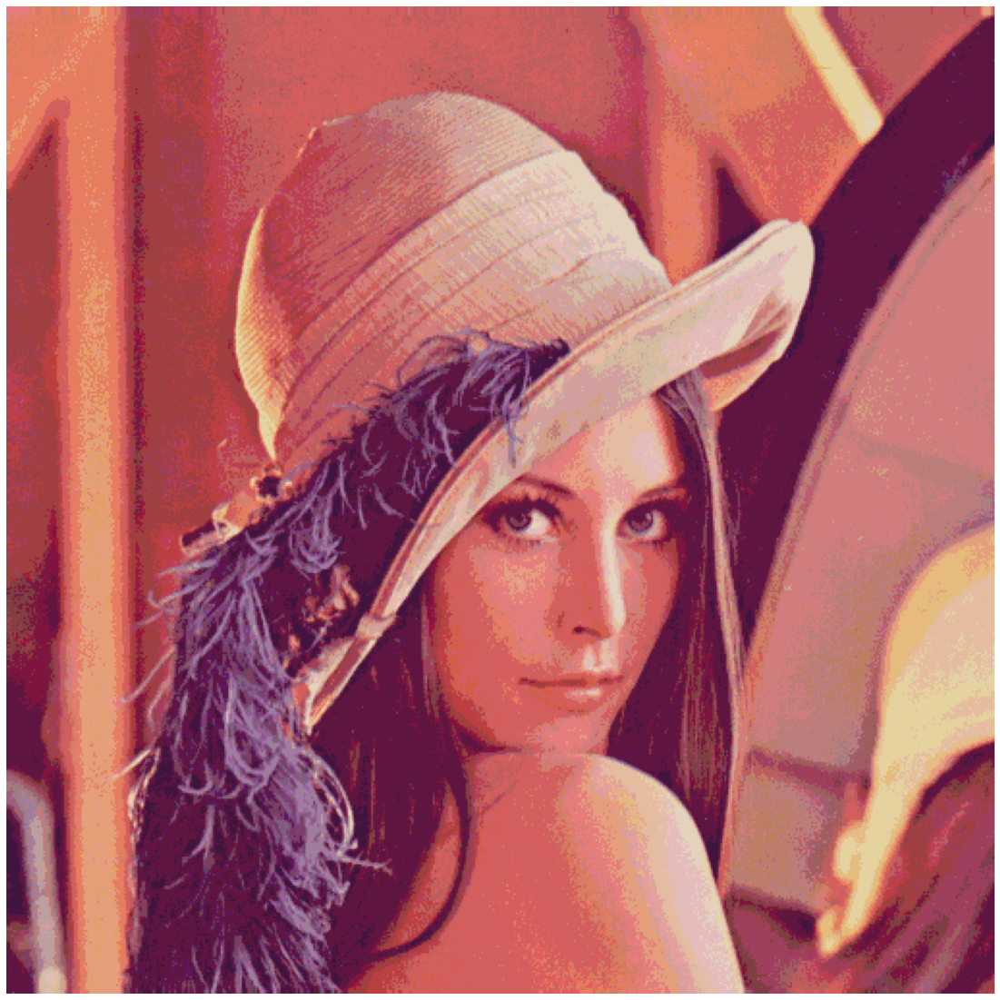

In [40]:
imshow(q64)
imshow(q32)
imshow(q16)
imshow(q8)

In [41]:
pandas.DataFrame(columns=('K','MSE','PSNR'),
                 data=[('64', mse(q64, lena), PSNR(q64, lena)),
                       ('32', mse(q32, lena), PSNR(q32, lena)),
                       ('16', mse(q16, lena), PSNR(q16, lena)),
                       ('8', mse(q8, lena), PSNR(q8, lena))
                       ])

,K,MSE,PSNR
0,64,0.112879,57.604655
1,32,4.061811,42.043607
2,16,16.662619,35.913371
3,8,73.068895,29.493478


##6.2.2. For the Lena image, quantize the R, G, and B components to 3, 3, and 2 bits, respectively

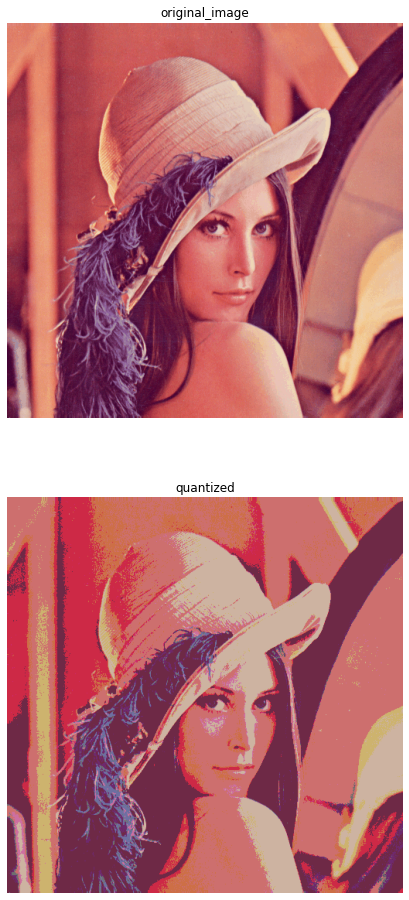

In [44]:
quantized_x = quantize_channels(lena,[3,3,2])
imshow(lena, quantized_x, title=['original_image','quantized'], figsize=16)

##6.2.3. We want to weave the Baboon image on a rug.

In [45]:
baboon = cv2.imread('/content/sample_data/Baboon.bmp', cv2.IMREAD_UNCHANGED)

,K,MSE
0,32,5.123638
1,16,18.656756
2,8,66.932964


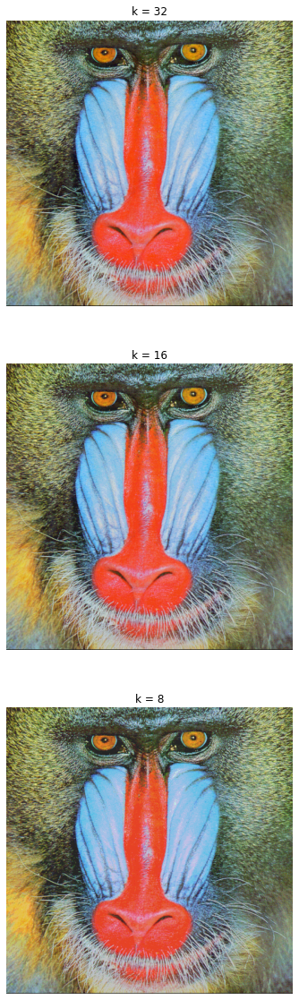

In [46]:
q32 = quantize_global(baboon, 32)
q16 = quantize_global(baboon, 16)
q8 = quantize_global(baboon, 8)

imshow(q32, q16, q8, title=['k = 32', 'k = 16', 'k = 8'], figsize=20)

pandas.DataFrame(columns=('K','MSE'),
                 data=[('32', mse(q32, baboon)),
                       ('16', mse(q16, baboon)),
                       ('8', mse(q8, baboon))
                       ])